Comparative analysis (Evaluating on CLIP scores)

1. Stable diffusion 1.5

In [ ]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.8 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-tvwsk5td
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-tvwsk5td
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=0438b24150161790b3c36f223f4c3c8b9c571b3729854e4a91e2a3626231db2d
  Stored in directory: /tmp/pip-ephem-wheel-cache-mpj7tr6o/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


In [ ]:
!pip install torch-fidelity

In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 19.4 MB/s eta 0:00:00


In [ ]:
import torch
import torchvision
import clip
from torch_fidelity import calculate_metrics
from diffusers import StableDiffusionPipeline

print("Torch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CLIP model loaded successfully!")
print("Torch-Fidelity ready!")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Torch version: 2.5.1+cu121
Torchvision version: 0.20.1+cu121
CLIP model loaded successfully!
Torch-Fidelity ready!


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
from transformers import CLIPProcessor, CLIPModel
import numpy as np
from PIL import Image

# Load the Stable Diffusion model
model_ckpt = "runwayml/stable-diffusion-v1-5"
sd_pipeline = StableDiffusionPipeline.from_pretrained(model_ckpt, torch_dtype=torch.float16).to("cuda")

# Prompts for image generation
prompts = [
    "A golden retriever playing in the snow.",
    "A sunset over a mountain range.",
    "A cat sitting on a couch.",
    "An astronaut riding a horse on mars",
    "A small cabin on top of a snowy mountain in the style of Disney, artstation",
]

# Generate images
generated_images = sd_pipeline(prompts, num_images_per_prompt=1, output_type="np").images  # Output as NumPy arrays
print(f"Generated images shape: {generated_images.shape}")  # Example: (3, 512, 512, 3)

# Load the CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16").to("cuda")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

# Function to calculate individual CLIP scores
def calculate_individual_clip_scores(images, prompts, clip_processor, clip_model):
    pil_images = [Image.fromarray((image * 255).astype("uint8")) for image in images]  # Convert to PIL images
    inputs = clip_processor(text=prompts, images=pil_images, return_tensors="pt", padding=True).to("cuda")
    outputs = clip_model(**inputs)
    logits_per_image = outputs.logits_per_image  # Image-text similarity scores

    individual_scores = logits_per_image.tolist()  # Convert scores to list
    return individual_scores

# Compute individual CLIP scores
individual_clip_scores = calculate_individual_clip_scores(
    generated_images, prompts, clip_processor, clip_model
)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated images shape: (5, 512, 512, 3)


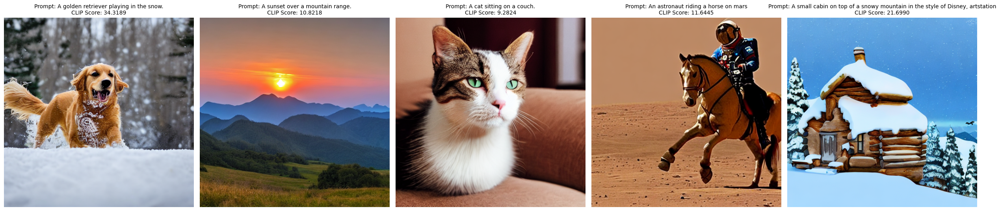

In [ ]:
import matplotlib.pyplot as plt

# Display the generated images with their prompts and CLIP scores
def display_images_with_scores(images, prompts, scores):
    plt.figure(figsize=(25, 10))
    for i, (image, prompt, score) in enumerate(zip(images, prompts, scores)):
        # Convert the image to a displayable format
        img = (image * 255).astype("uint8")  # Scale back to 0–255 for display
        plt.subplot(1, len(prompts), i + 1)  # Adjust subplot grid for the number of images
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Prompt: {prompt}\nCLIP Score: {score[0]:.4f}", fontsize=10)
    plt.tight_layout()
    plt.show()

# Call the function to display the images
display_images_with_scores(generated_images, prompts, individual_clip_scores)

In [ ]:
# Print individual CLIP scores
for prompt, score in zip(prompts, individual_clip_scores):
    print(f"Prompt: '{prompt}', CLIP Score: {score[0]:.4f}")

Prompt: 'A golden retriever playing in the snow.', CLIP Score: 34.3189
Prompt: 'A sunset over a mountain range.', CLIP Score: 10.8218
Prompt: 'A cat sitting on a couch.', CLIP Score: 9.2824
Prompt: 'An astronaut riding a horse on mars', CLIP Score: 11.6445
Prompt: 'A small cabin on top of a snowy mountain in the style of Disney, artstation', CLIP Score: 21.6990


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
from torchmetrics.functional.multimodal import clip_score
from functools import partial
import numpy as np
# Define the CLIP score function
clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

# Calculate CLIP score
def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")  # Convert to uint8
    clip_score_value = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()  # Convert to PyTorch Tensor
    return round(float(clip_score_value), 4)

# Compute CLIP score for Stable Diffusion
sd_clip_score = calculate_clip_score(generated_images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.3998


2. Dall E Mini

In [ ]:
! pip install min-dalle -q


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.9/586.9 kB 9.3 MB/s eta 0:00:00


In [ ]:
from min_dalle import MinDalle

model = MinDalle(is_mega=True, is_reusable=True)

using device cuda
downloading tokenizer params
intializing TextTokenizer
downloading encoder params
initializing DalleBartEncoder


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:122: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  params = torch.load(self.encoder_params_path)


downloading decoder params
initializing DalleBartDecoder


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:140: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  params = torch.load(self.decoder_params_path)


downloading detokenizer params
initializing VQGanDetokenizer


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:151: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  params = torch.load(self.detoker_params_path)


In [ ]:
from transformers import CLIPProcessor, CLIPModel
import torch
# Define multiple prompts
prompts = [
    "A golden retriever playing in the snow.",
    "A sunset over a mountain range.",
    "A cat sitting on a couch.",
    "An astronaut riding a horse on mars",
    "A small cabin on top of a snowy mountain in the style of Disney, artstation",
]
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16").to("cuda")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

# Initialize results storage
results = []
sum = 0

# Loop through prompts, generate images, and calculate CLIP scores
for text in prompts:
    # Generate image
    generated_image = model.generate_image(text, seed=6, grid_size=1).convert("RGB")

    # Prepare for CLIP evaluation
    inputs = clip_processor(text=[text], images=[generated_image], return_tensors="pt", padding=True).to("cuda")

    # Calculate CLIP score
    with torch.no_grad():
        outputs = clip_model(**inputs)
        logits_per_image = outputs.logits_per_image
        clip_score = logits_per_image.item()

    # Save results
    results.append((text, generated_image, clip_score))
    sum+=clip_score
    print(f"Prompt: '{text}', CLIP Score: {clip_score:.4f}")

average_clip_score = sum/len(prompts)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:201: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:208: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

Prompt: 'A golden retriever playing in the snow.', CLIP Score: 33.1885
Prompt: 'A sunset over a mountain range.', CLIP Score: 30.7240
Prompt: 'A cat sitting on a couch.', CLIP Score: 29.8946
Prompt: 'An astronaut riding a horse on mars', CLIP Score: 37.4111
Prompt: 'A small cabin on top of a snowy mountain in the style of Disney, artstation', CLIP Score: 32.2900


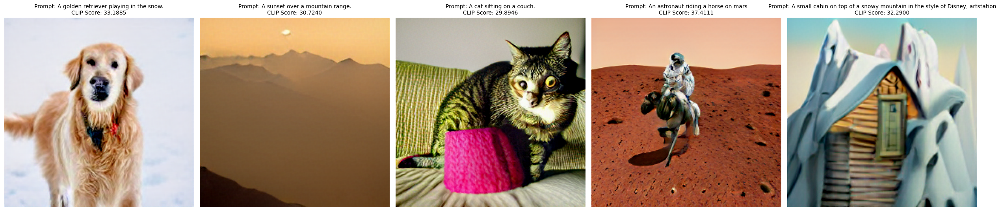

In [ ]:

# Display all images with prompts and scores

from PIL import Image
import matplotlib.pyplot as plt
plt.figure(figsize=(25, 20))
for i, (text, image, score) in enumerate(results):
    plt.subplot(1, len(prompts), i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Prompt: {text}\nCLIP Score: {score:.4f}", fontsize=10)
plt.tight_layout()
plt.show()

In [ ]:
print(f"Overall Average CLIP Score for the model: {average_clip_score:.4f}")

Overall Average CLIP Score for the model: 32.7017


3. SDXL 1.0

In [ ]:
!pip install -q transformers accelerate git+https://github.com/huggingface/diffusers compel

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
from diffusers import DiffusionPipeline
import torch
from compel import Compel, ReturnedEmbeddingsType
from diffusers import DiffusionPipeline, AutoencoderKL
from PIL import Image
from datetime import datetime
from tqdm.auto import tqdm
import os
from random import randint

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix",
                                    torch_dtype=torch.float16)
base = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)

base.load_lora_weights("minimaxir/sdxl-wrong-lora")
_ = base.to("cuda")
# base.enable_model_cpu_offload()  # recommended for T4 GPU if enough system RAM

refiner = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    text_encoder_2=base.text_encoder_2,
    vae=base.vae,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
)

_ = refiner.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

pytorch_lora_weights.bin:   0%|          | 0.00/23.7M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.71k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/4.52G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
compel_base = Compel(tokenizer=[base.tokenizer, base.tokenizer_2] , text_encoder=[base.text_encoder, base.text_encoder_2], returned_embeddings_type=ReturnedEmbeddingsType.PENULTIMATE_HIDDEN_STATES_NON_NORMALIZED, requires_pooled=[False, True])
compel_refiner = Compel(tokenizer=refiner.tokenizer_2 , text_encoder=refiner.text_encoder_2, returned_embeddings_type=ReturnedEmbeddingsType.PENULTIMATE_HIDDEN_STATES_NON_NORMALIZED, requires_pooled=True)

high_noise_frac = 0.8

In [ ]:
# List of prompts
prompts = [
    "A golden retriever playing in the snow.",
    "A sunset over a mountain range.",
    "A cat sitting on a couch.",
    "An astronaut riding a horse on mars",
    "A small cabin on top of a snowy mountain in the style of Disney, artstation",
]

In [ ]:
def gen_images(prompts, cfg=13, seed=-1, webp_output=True):
    results = []
    for i, source_prompt in enumerate(prompts):
        print(f"Generating image {i + 1}/{len(prompts)} for prompt: {source_prompt}")

        if seed < 0:
            seed = randint(0, 10**8)
            print(f"Seed: {seed}")

        prompt = source_prompt
        negative_prompt = "low quality, blurry, bad composition"  # Customize as needed

        # Positive and negative conditioning using Compel
        conditioning, pooled = compel_base(prompt)
        conditioning_neg, pooled_neg = compel_base(negative_prompt) if negative_prompt is not None else (None, None)
        generator = torch.Generator(device="cuda").manual_seed(seed)

        # Generate latent representation with the base model
        latents = base(
            prompt_embeds=conditioning,
            pooled_prompt_embeds=pooled,
            negative_prompt_embeds=conditioning_neg,
            negative_pooled_prompt_embeds=pooled_neg,
            guidance_scale=cfg,
            denoising_end=high_noise_frac,
            generator=generator,
            output_type="latent",
            cross_attention_kwargs={"scale": 1.}
        ).images

        # Refine the latent representation with the refiner model
        conditioning, pooled = compel_refiner(prompt)
        conditioning_neg, pooled_neg = compel_refiner(negative_prompt) if negative_prompt is not None else (None, None)
        generator = torch.Generator(device="cuda").manual_seed(seed)

        images = refiner(
            prompt_embeds=conditioning,
            pooled_prompt_embeds=pooled,
            negative_prompt_embeds=conditioning_neg,
            negative_pooled_prompt_embeds=pooled_neg,
            guidance_scale=cfg,
            denoising_start=high_noise_frac,
            image=latents,
            generator=generator,
        ).images

        # Save and display the image
        image = images[0]
        display(image.resize((image.width // 2, image.height // 2)))
        image.save(f"image_{i + 1}.webp" if webp_output else f"image_{i + 1}.png")

        results.append((prompt, image))
    return results

Generating image 1/5 for prompt: A golden retriever playing in the snow.


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

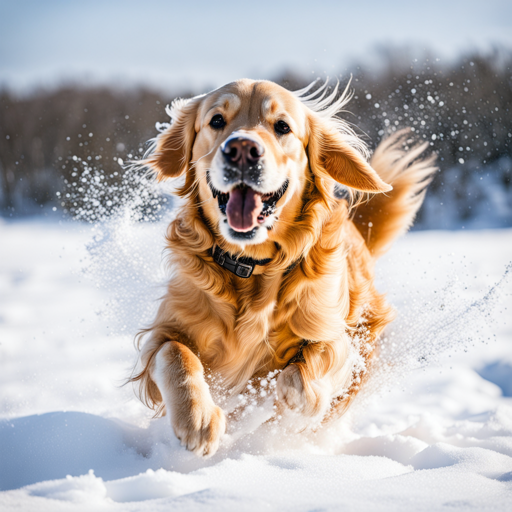

Generating image 2/5 for prompt: A sunset over a mountain range.


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

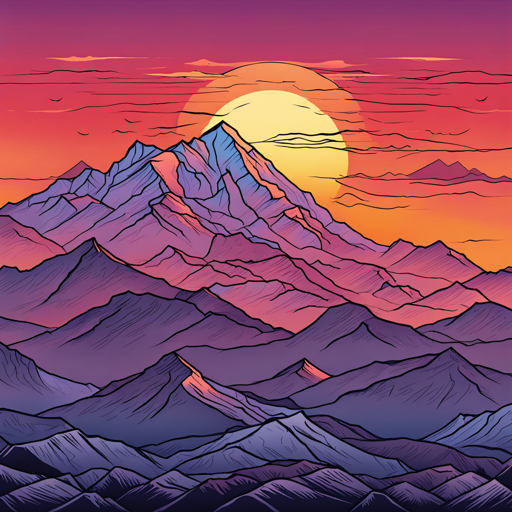

Generating image 3/5 for prompt: A cat sitting on a couch.


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

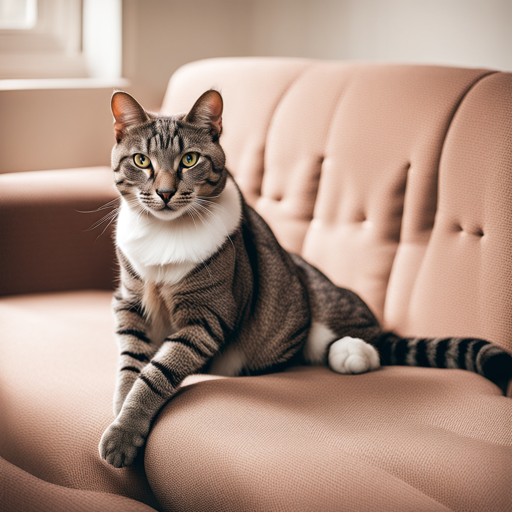

Generating image 4/5 for prompt: An astronaut riding a horse on mars


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

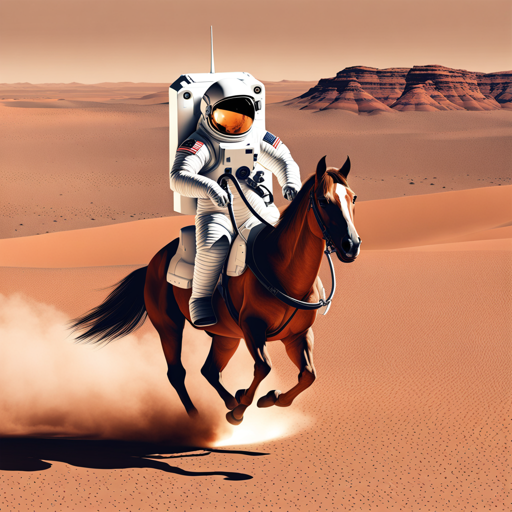

Generating image 5/5 for prompt: A small cabin on top of a snowy mountain in the style of Disney, artstation


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

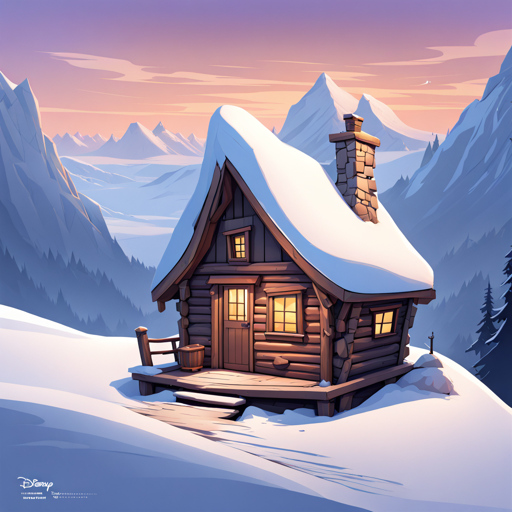

In [ ]:
# Generate images for all prompts
results = gen_images(prompts, cfg=13, seed=42, webp_output=False)

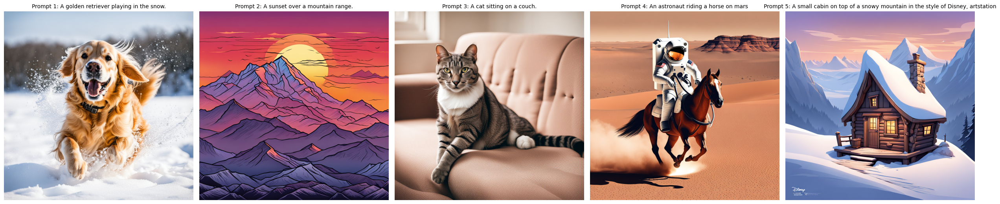

In [ ]:
import matplotlib.pyplot as plt

# Display all images
plt.figure(figsize=(25, 15))
for i, (prompt, image) in enumerate(results):
    plt.subplot(1, len(prompts), i + 1)  # Adjust grid size based on number of prompts
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Prompt {i + 1}: {prompt}", fontsize=10)
plt.tight_layout()
plt.show()

In [ ]:
from transformers import CLIPProcessor, CLIPModel
import torch
from PIL import Image

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16").to("cuda")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
def calculate_clip_scores(results):
    clip_scores = []
    for i, (prompt, image) in enumerate(results):
        # Prepare the image and prompt for CLIP evaluation
        inputs = clip_processor(text=[prompt], images=[image], return_tensors="pt", padding=True).to("cuda")

        # Compute the CLIP score
        with torch.no_grad():
            outputs = clip_model(**inputs)
            logits_per_image = outputs.logits_per_image
            score = logits_per_image.item()  # Extract scalar score
            clip_scores.append((prompt, score))
            print(f"Prompt {i + 1}: {prompt} | CLIP Score: {score:.4f}")

    # Calculate the average CLIP score
    average_score = sum(score for _, score in clip_scores) / len(clip_scores)
    print(f"\nAverage CLIP Score for the model: {average_score:.4f}")

    return clip_scores, average_score

In [ ]:
def calculate_clip_scores(results):
    clip_scores = []
    for i, (prompt, image) in enumerate(results):
        # Prepare the image and prompt for CLIP evaluation
        inputs = clip_processor(text=[prompt], images=[image], return_tensors="pt", padding=True).to("cuda")

        # Compute the CLIP score
        with torch.no_grad():
            outputs = clip_model(**inputs)
            logits_per_image = outputs.logits_per_image
            score = logits_per_image.item()  # Extract scalar score
            clip_scores.append((prompt, score))
            print(f"Prompt {i + 1}: {prompt} | CLIP Score: {score:.4f}")

    # Calculate the average CLIP score
    average_score = sum(score for _, score in clip_scores) / len(clip_scores)
    print(f"\nAverage CLIP Score for the model: {average_score:.4f}")

    return clip_scores, average_score

In [ ]:
clip_scores, average_clip_score = calculate_clip_scores(results)

Prompt 1: A golden retriever playing in the snow. | CLIP Score: 34.2417
Prompt 2: A sunset over a mountain range. | CLIP Score: 31.6609
Prompt 3: A cat sitting on a couch. | CLIP Score: 31.2160
Prompt 4: An astronaut riding a horse on mars | CLIP Score: 36.2001
Prompt 5: A small cabin on top of a snowy mountain in the style of Disney, artstation | CLIP Score: 38.6285

Average CLIP Score for the model: 34.3894


In [ ]:
print(f"Overall Average CLIP Score for the model: {average_clip_score:.4f}")

Overall Average CLIP Score for the model: 34.3894
